<a href="https://colab.research.google.com/github/laresamdeola/Machine-Learning/blob/main/Audio_Engineering_Preprocessing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [28]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import nltk
import random
import librosa
import tensorflow as tf
from tensorflow.keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense,Dropout,Activation,Flatten
from tensorflow.keras.optimizers import Adam
from sklearn import metrics
from tensorflow.keras.callbacks import ModelCheckpoint
from datetime import datetime
from moviepy.editor import AudioFileClip
import os

In [72]:
!pip install ffmpeg

  Preparing metadata (setup.py) ... done
  Created wheel for ffmpeg: filename=ffmpeg-1.4-py3-none-any.whl size=6082 sha256=be33c1905e2e03103bd830f8643c26adae48f96e7fb465147764bf6561177bfe
  Stored in directory: /root/.cache/pip/wheels/8e/7a/69/cd6aeb83b126a7f04cbe7c9d929028dc52a6e7d525ff56003a
Successfully built ffmpeg


In [91]:
!pip install audioread

In [93]:
import audioread

In [29]:
# data = pd.read_csv('words_praise_thesis.csv')

In [30]:
# words = data.iloc[:, 0].values

In [31]:
# print(words)

In [32]:
# len(words)

In [33]:
# print(type(words))

In [34]:
# words_list = list(words)

In [35]:
# def select_random_words(amount_of_words):
#   random.shuffle(words_list)
#   random.choices(words_list, k=amount_of_words)
#   return words_list[:amount_of_words]

In [36]:
# print(select_random_words(10))

In [37]:
import IPython.display as ipd

Audio Sample Test

In [57]:
sample_1 = '/content/sample_data/Praise-Vocals/Operate.MP4'
ipd.Audio(sample_1)

In [87]:
ground_truth_filepath_2 = os.listdir('/content/sample_data/Praise-Vocals-2/')

In [88]:
ground_truth_filepath_2[3]

'Time.MP4'

In [40]:
import os

In [41]:
os.getcwd()

'/content'

Noise Directory List

In [42]:
noise_filepath = os.listdir('/content/sample_data/Noise-2')

In [43]:
ground_truth_filepath = os.listdir('/content/sample_data/Praise-Vocals')

Ground Truth Directory List

In [44]:
# where the ground truth files are - Praise-Vocals-2

ground_truth_filepath_2 = os.listdir('/content/sample_data/Praise-Vocals-2')

Ground Truth List

In [64]:
ground_truth_filepath_2

['Operate.MP4',
 'Stand.MP4',
 'Done.MP4',
 'Time.MP4',
 'Great.MP4',
 'Cell.MP4',
 'No.MP4',
 'The.MP4',
 'Post.MP4',
 'Hands.MP4',
 'Test.MP4',
 'Working.MP4',
 'Stop.MP4',
 'Hurry.MP4',
 'Free.MP4',
 'Busy.MP4',
 'Ration.MP4',
 'Scared.MP4',
 'Late.MP4',
 'Court.MP4',
 'Fire.MP4',
 'Class.MP4',
 'Loose.MP4',
 'Total.MP4',
 'Admit.MP4',
 'All.MP4',
 'Try.MP4',
 'Build.MP4',
 'Drop.MP4',
 'Instruct.MP4',
 'Grab.MP4',
 'Frame.MP4',
 'Round.MP4',
 'Seek.MP4',
 'Join.MP4',
 'Hope.MP4',
 'Happen.MP4',
 'Leave.wav',
 'View.MP4',
 'True.MP4',
 'Instead.MP4',
 'How.MP4',
 'Apply.MP4',
 'Stay.wav',
 'Add.MP4',
 'Neither.MP4',
 'Bill.MP4',
 'Top.MP4',
 'Let.MP4',
 'Decide.MP4',
 'Call.MP4',
 'Date.MP4',
 'Group.MP4',
 'Sad.MP4',
 'Trust.MP4',
 'First.MP4',
 'Forgive .MP4',
 'Close.MP4',
 'Search .MP4',
 'Fear.MP4',
 'Amidst.MP4',
 'Rise.MP4',
 'Settle.MP4',
 'Region.MP4',
 'Achieve.MP4',
 'You.MP4',
 'Olive.MP4',
 'Elite.MP4',
 'Has.MP4',
 'Race.MP4',
 'Severe.MP4',
 'Come.MP4',
 'Bag.MP4',
 '

In [45]:
# ground_truth_filepath

In [46]:
os.getcwd() + '/sample_data/Noise-1/Date.m4a'

'/content/sample_data/Noise-1/Date.m4a'

In [53]:
# # List of m4a files to convert
# m4a_files = noise_filepath  # Add your file names here
# print(m4a_files)

# # Loop through each m4a file and convert to mp3
# for m4a_file in m4a_files:
#     # Load m4a file
#     audio_clip = AudioFileClip(C)

#     # # Extract file name without extension
#     file_name = os.path.splitext(m4a_file)[0]

#     # # Output mp3 file path
#     mp3_file = f"/content/sample_data/Noise-2/{file_name}.mp3"

#     # # Write audio clip to mp3 file
#     audio_clip.write_audiofile(mp3_file)

#     # # Close audio clip
#     audio_clip.close()

# print("Conversion completed successfully!")

In [48]:
# from moviepy.editor import VideoFileClip

# def convert_mp4_to_mp3(input_file, output_file):
#     #video_clip = VideoFileClip(input_file)
#     #audio_clip = video_clip.audio
#     audio_clip = AudioFileClip(input_file)
#     audio_clip.write_audiofile(output_file)
#     mp3_file = f"/content/sample_data/Praise-Vocals-2/{file_name}.mp3"
#     # # Write audio clip to mp3 file
#     audio_clip.write_audiofile(mp3_file)
#     audio_clip.close()
#     # video_clip.close()

In [52]:
# mp4_files = ground_truth_filepath

# for mp4_file in mp4_files:
#     output_file = mp4_file.replace(".MP4", ".mp3")
#     file_name = os.path.splitext(mp4_file)[0]
#     to_ignore = ['Date.m4a', 'Build.MP4', 'Love.MP4', 'Give.MP4']
#     if mp4_file in to_ignore:
#       continue
#     convert_mp4_to_mp3(mp4_file, output_file)
#     print(f"Converted {mp4_file} to {output_file}")

In [ ]:
# noise_filepath

In [61]:
# ground_truth_filepath

Waveforms

In [157]:
ignored = {".config", ".ipynb_checkpoints", "sample_data"}
filepaths = [i for i in ground_truth_filepath_2 if i not in ignored]
filepaths_2 = [i for i in noise_filepath if i not in ignored]

def audio_files(filepath):
  for i in filepath:
    to_ignore = ['Date.m4a', 'Build.MP4', 'Love.MP4', 'Give.MP4', 'Operate.MP4']
    if i in to_ignore:
      continue
    data, sample_rate = librosa.load('/content/sample_data/Noise-2/' + i)
    plt.figure(figsize=(12, 5))
    librosa.display.waveshow(data, sr=sample_rate)

In [141]:
len(filepaths)

98

  data, sample_rate = librosa.load('/content/sample_data/Praise-Vocals-2/' + i)

  data, sample_rate = librosa.load('/content/sample_data/Praise-Vocals-2/' + i)

  data, sample_rate = librosa.load('/content/sample_data/Praise-Vocals-2/' + i)

  data, sample_rate = librosa.load('/content/sample_data/Praise-Vocals-2/' + i)

  data, sample_rate = librosa.load('/content/sample_data/Praise-Vocals-2/' + i)

  data, sample_rate = librosa.load('/content/sample_data/Praise-Vocals-2/' + i)

  data, sample_rate = librosa.load('/content/sample_data/Praise-Vocals-2/' + i)

  data, sample_rate = librosa.load('/content/sample_data/Praise-Vocals-2/' + i)

  data, sample_rate = librosa.load('/content/sample_data/Praise-Vocals-2/' + i)

  data, sample_rate = librosa.load('/content/sample_data/Praise-Vocals-2/' + i)

  data, sample_rate = librosa.load('/content/sample_data/Praise-Vocals-2/' + i)

  data, sample_rate = librosa.load('/content/sample_data/Praise-Vocals-2/' + i)

  data, sample_rate = libros

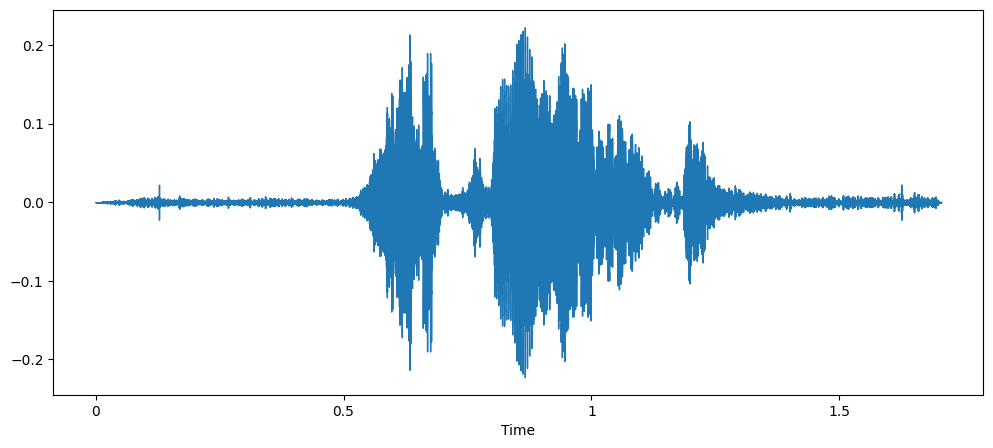

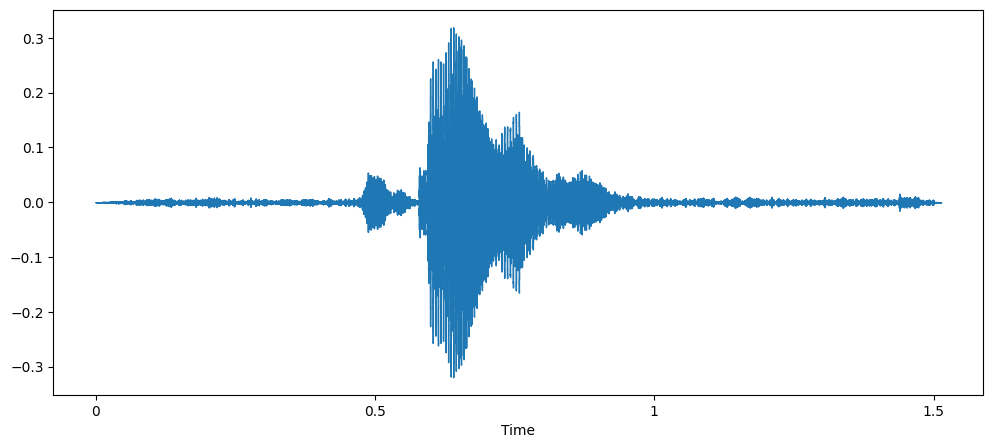

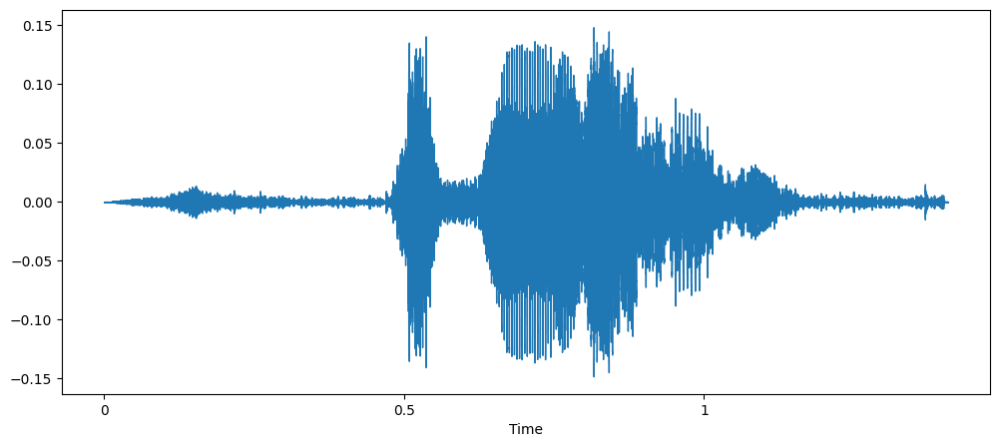

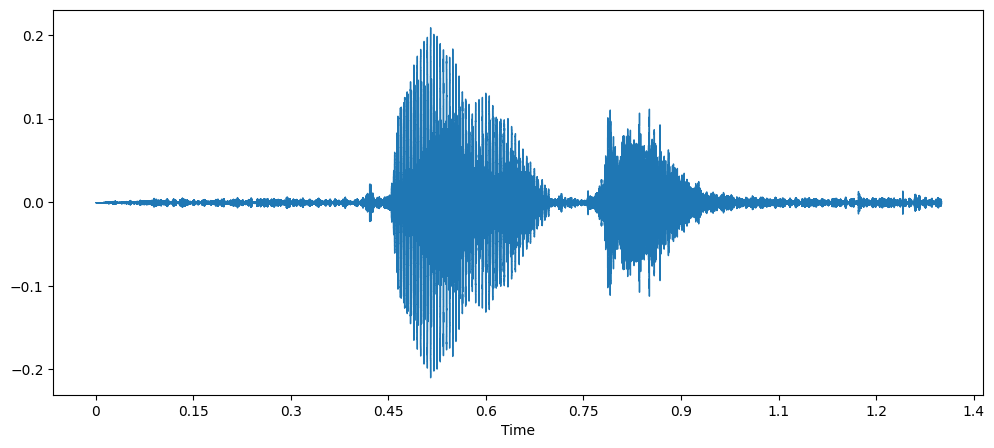

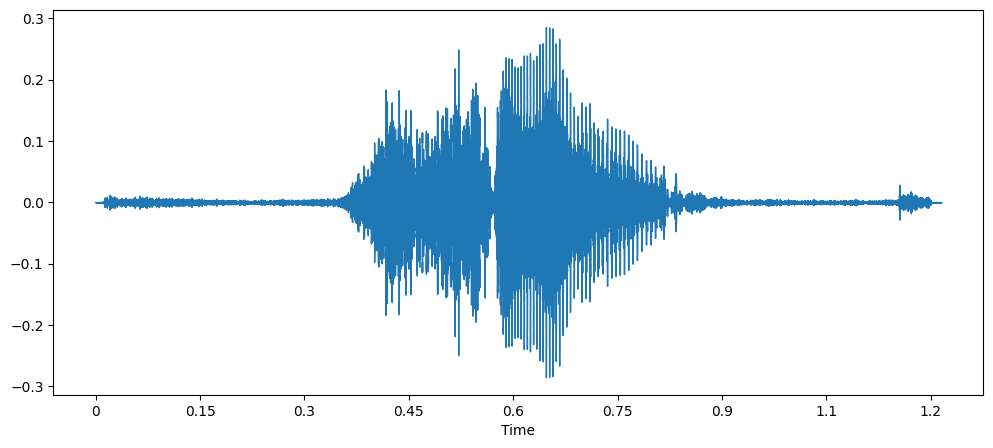

...

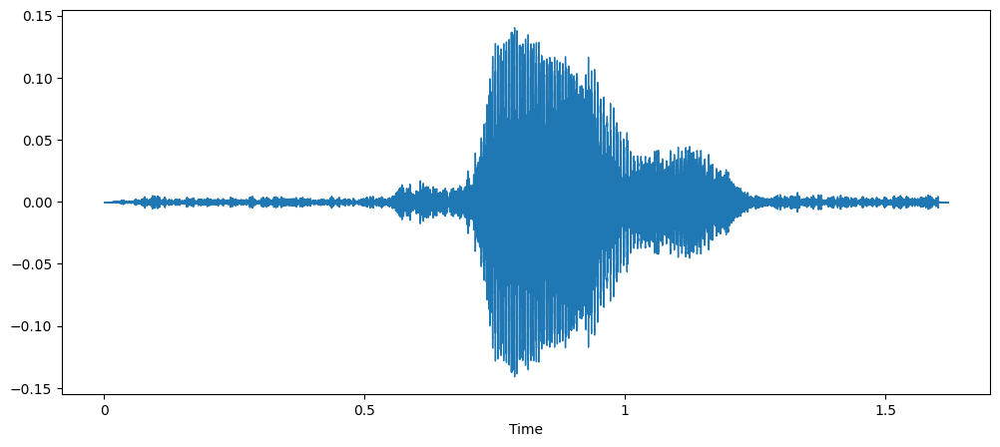

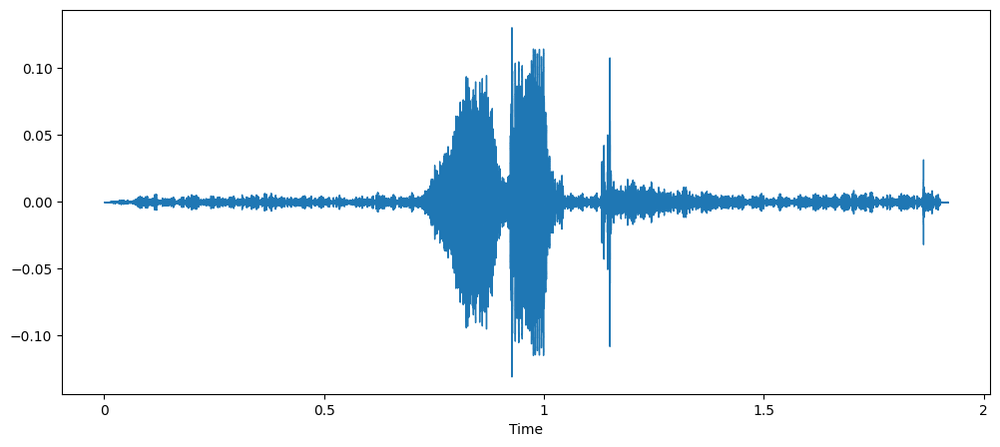

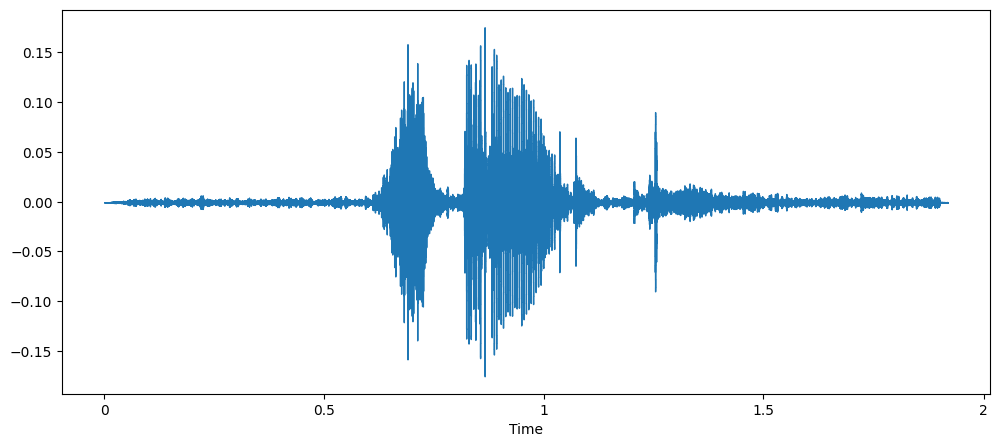

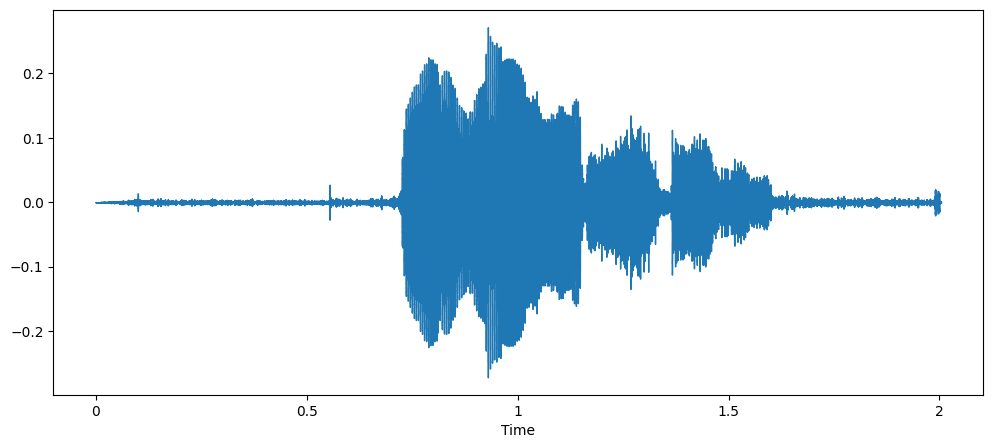

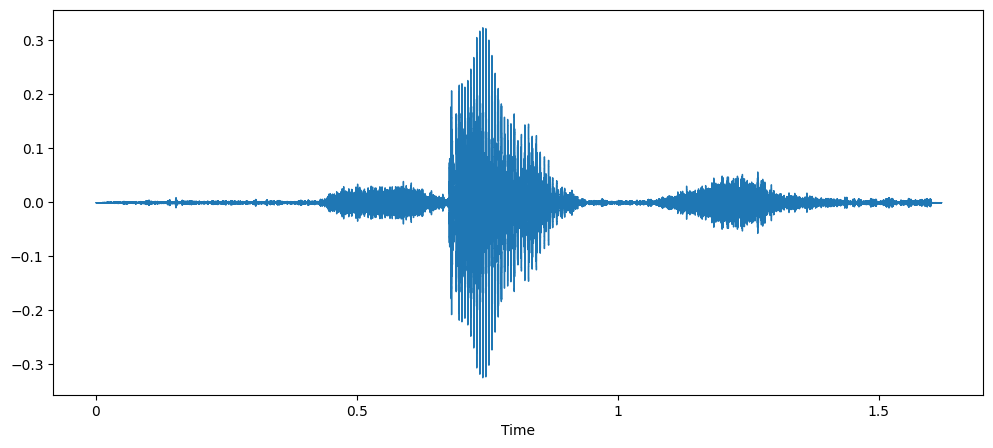

In [142]:
audio_files(filepaths_2)

In [ ]:
# Reference

# https://librosa.org/doc/latest/tutorial.html

In [116]:
# audio_files(filepaths_2)

Extracting Tempo, Sampling rate and the audio data using Librosa

In [131]:
filename = librosa.example('nutcracker')

waveform, sampling_rate = librosa.load(filename)

tempo, beat_frames = librosa.beat.beat_track(y=waveform, sr=sampling_rate)
print(f'Estimated Tempo: {round(tempo, 2)} beats per minute')

Estimated Tempo: 107.67 beats per minute


Sample of Waveform

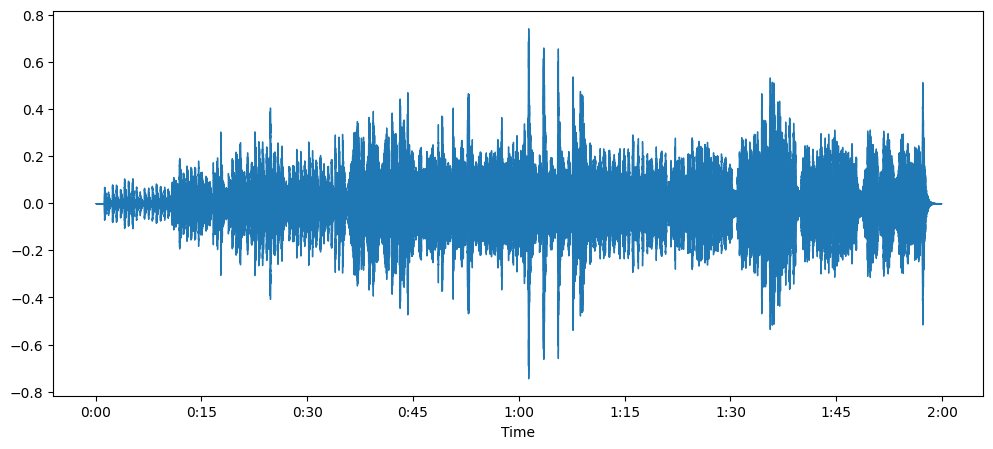

In [132]:
plt.figure(figsize=(12, 5))
librosa.display.waveshow(waveform, sr=sampling_rate)

Sample Audio Full Song

In [223]:
ipd.Audio(filename)

Displaying a Spectogram

  waveform, sampling_rate = librosa.load('/content/sample_data/Noise-2/' + i)

  waveform, sampling_rate = librosa.load('/content/sample_data/Noise-2/' + i)

  waveform, sampling_rate = librosa.load('/content/sample_data/Noise-2/' + i)

  waveform, sampling_rate = librosa.load('/content/sample_data/Noise-2/' + i)

  waveform, sampling_rate = librosa.load('/content/sample_data/Noise-2/' + i)

  waveform, sampling_rate = librosa.load('/content/sample_data/Noise-2/' + i)

  waveform, sampling_rate = librosa.load('/content/sample_data/Noise-2/' + i)

  waveform, sampling_rate = librosa.load('/content/sample_data/Noise-2/' + i)

  waveform, sampling_rate = librosa.load('/content/sample_data/Noise-2/' + i)

  waveform, sampling_rate = librosa.load('/content/sample_data/Noise-2/' + i)

  waveform, sampling_rate = librosa.load('/content/sample_data/Noise-2/' + i)

  waveform, sampling_rate = librosa.load('/content/sample_data/Noise-2/' + i)

  waveform, sampling_rate = librosa.load('/content/s

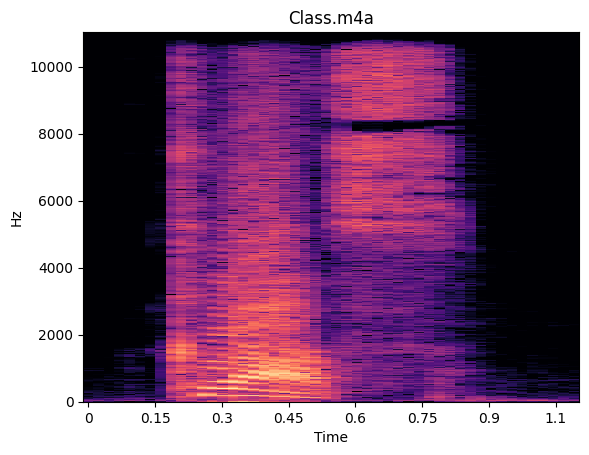

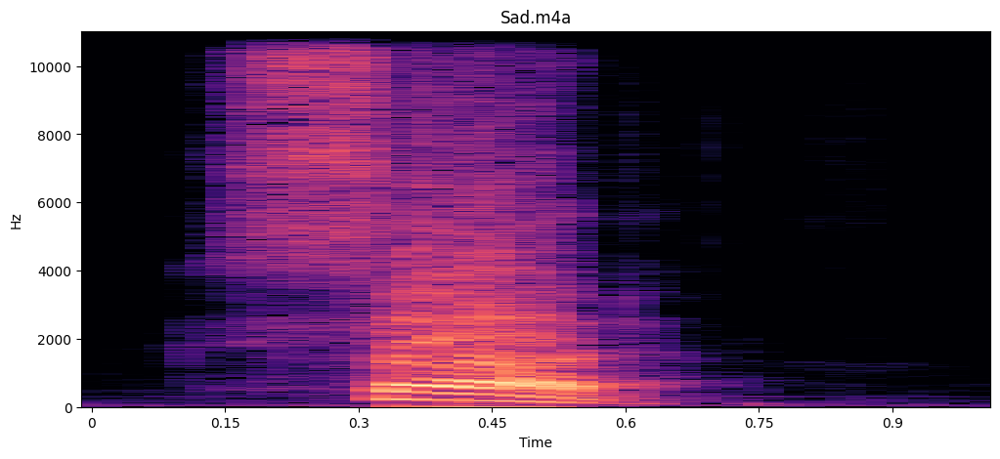

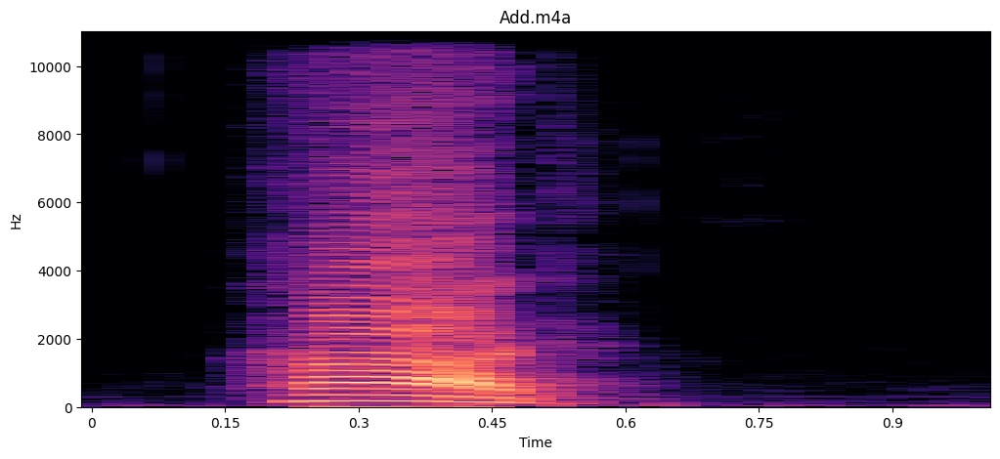

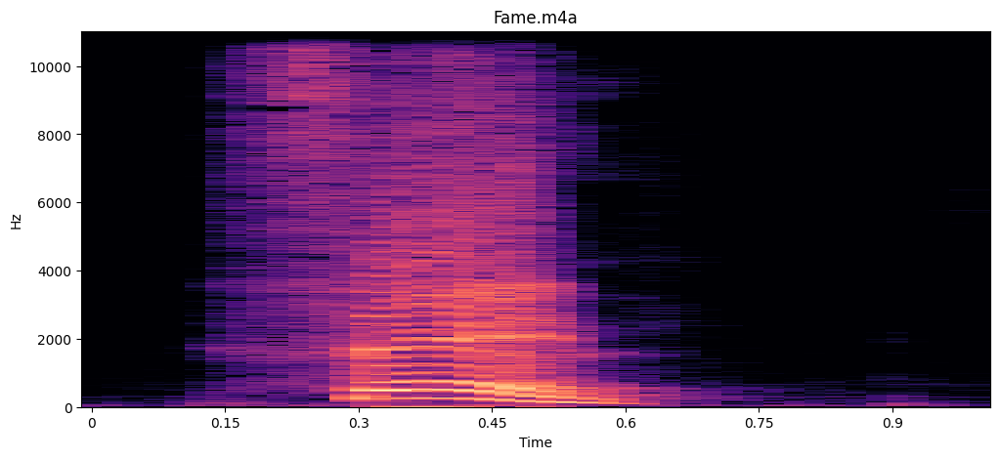

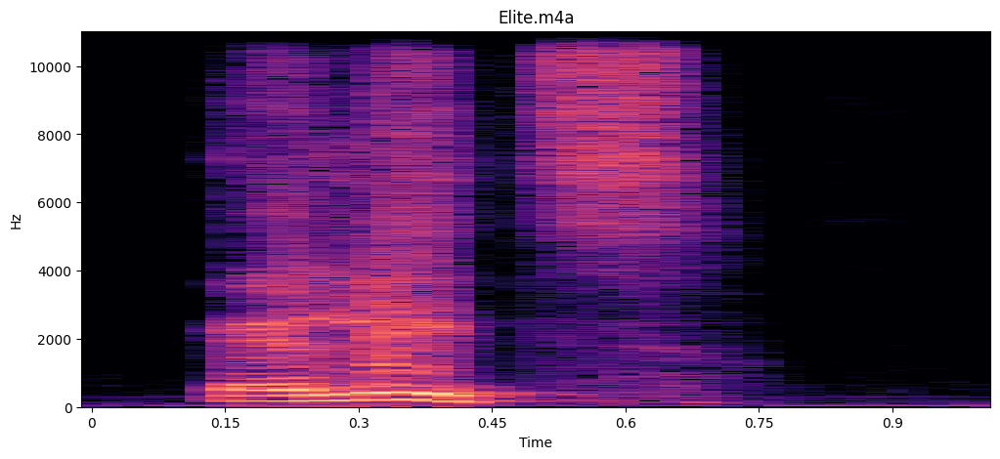

...

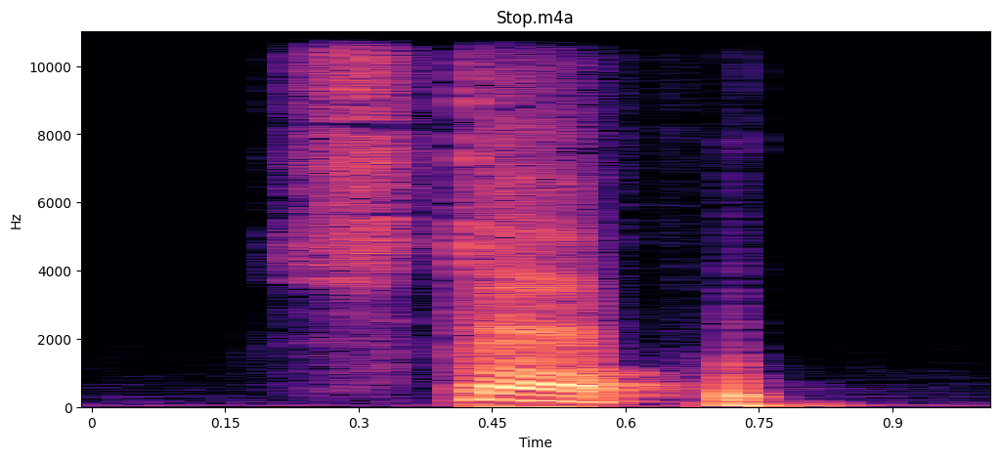

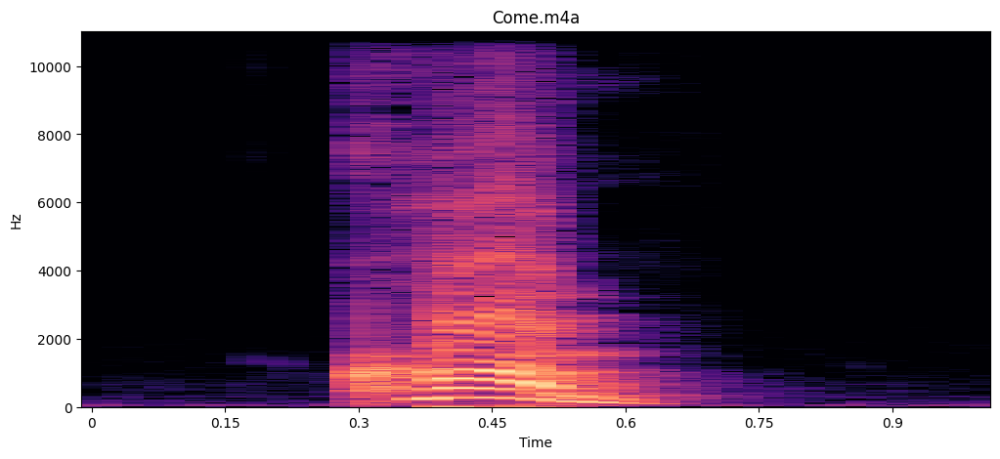

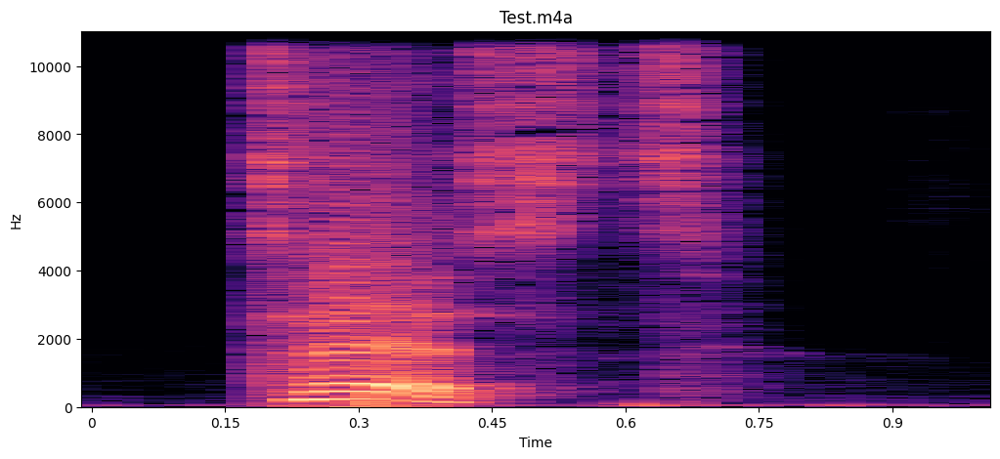

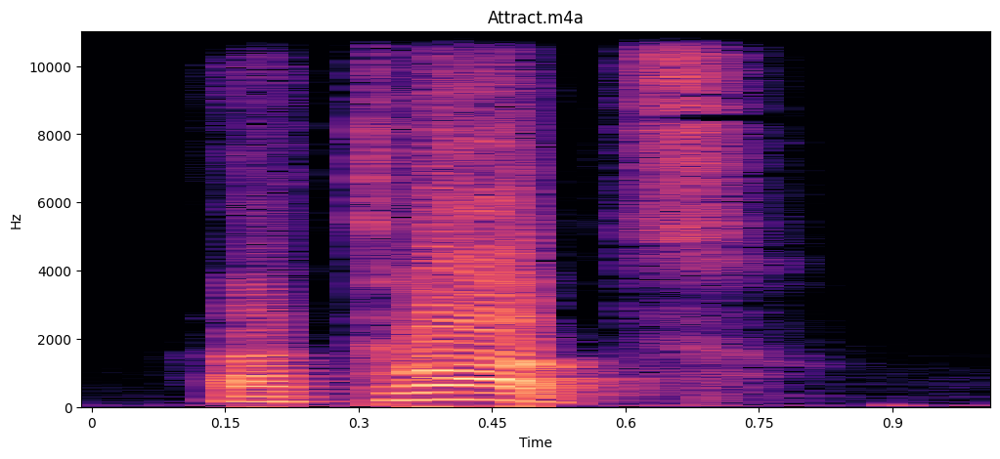

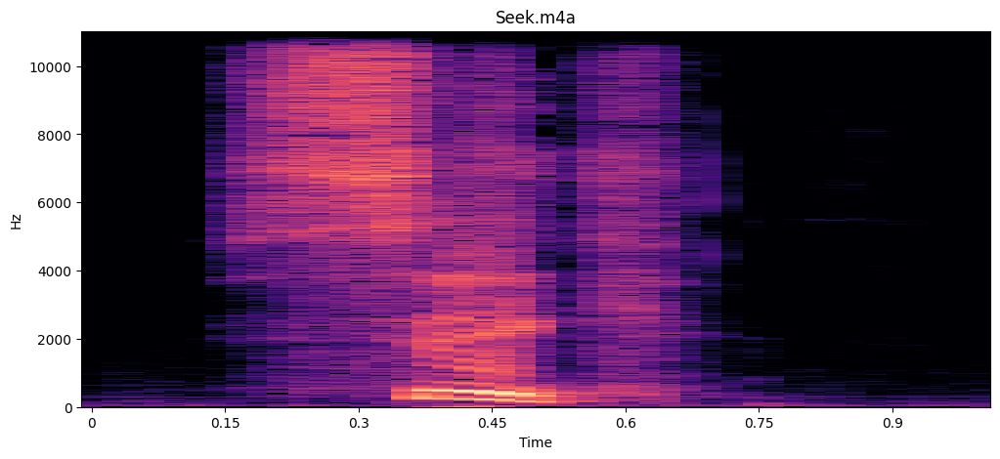

<Figure size 1200x500 with 0 Axes>

In [224]:
sample_test = '/content/sample_data/Praise-Vocals-2/Achieve.MP4'


for i in noise_filepath:
  waveform, sampling_rate = librosa.load('/content/sample_data/Noise-2/' + i)
  D = librosa.amplitude_to_db(np.abs(librosa.stft(waveform)), ref=np.max)
  librosa.display.specshow(D, y_axis='linear', x_axis='time', sr=sampling_rate)
  plt.title(i)
  plt.figure(figsize=(12, 5))

  # print('\n')
  # print('\n')

Find the index of any word in any of the label classes

In [196]:
def find_audio_index(filepath, audio_name):
  for index, value in enumerate(filepath):
    if isinstance(audio_name, str):
      if value == audio_name:
        print(index)
    else:
      print('error')

In [185]:
type(noise_filepath[84])

str

In [218]:
find_audio_index(ground_truth_filepath, 'Class.MP4')

# noise_filepath for noise list
# ground_truth_filepath for praise vocals

21


In [203]:
len(noise_filepath)

100

In [204]:
noise_filepath[98]

'Attract.m4a'

MFCC Features across classes - ground truth and noise

In [167]:
for i in ground_truth_filepath:
  to_ignore = ['Date.m4a', 'Build.MP4', 'Love.MP4', 'Give.MP4', 'Operate.MP4']
  if i in to_ignore:
    continue
  data_ground, sample_rate_ground = librosa.load('/content/sample_data/Praise-Vocals/' + i)

  data_ground, sample_rate_ground = librosa.load('/content/sample_data/Praise-Vocals/' + i)

  data_ground, sample_rate_ground = librosa.load('/content/sample_data/Praise-Vocals/' + i)

  data_ground, sample_rate_ground = librosa.load('/content/sample_data/Praise-Vocals/' + i)

  data_ground, sample_rate_ground = librosa.load('/content/sample_data/Praise-Vocals/' + i)

  data_ground, sample_rate_ground = librosa.load('/content/sample_data/Praise-Vocals/' + i)

  data_ground, sample_rate_ground = librosa.load('/content/sample_data/Praise-Vocals/' + i)

  data_ground, sample_rate_ground = librosa.load('/content/sample_data/Praise-Vocals/' + i)

  data_ground, sample_rate_ground = librosa.load('/content/sample_data/Praise-Vocals/' + i)

  data_ground, sample_rate_ground = librosa.load('/content/sample_data/Praise-Vocals/' + i)

  data_ground, sample_rate_ground = librosa.load('/content/sample_data/Praise-Vocals/' + i)

  data_ground, sample_rate_ground = librosa.load('/content/sample_data

In [202]:
for i in noise_filepath:
  to_ignore = ['Date.m4a', 'Build.MP4', 'Love.MP4', 'Give.MP4', 'Operate.MP4']
  if i in to_ignore:
    continue
  data_noise, sample_rate_noise = librosa.load('/content/sample_data/Noise-2/' + i)

  data_noise, sample_rate_noise = librosa.load('/content/sample_data/Noise-2/' + i)

  data_noise, sample_rate_noise = librosa.load('/content/sample_data/Noise-2/' + i)

  data_noise, sample_rate_noise = librosa.load('/content/sample_data/Noise-2/' + i)

  data_noise, sample_rate_noise = librosa.load('/content/sample_data/Noise-2/' + i)

  data_noise, sample_rate_noise = librosa.load('/content/sample_data/Noise-2/' + i)

  data_noise, sample_rate_noise = librosa.load('/content/sample_data/Noise-2/' + i)

  data_noise, sample_rate_noise = librosa.load('/content/sample_data/Noise-2/' + i)

  data_noise, sample_rate_noise = librosa.load('/content/sample_data/Noise-2/' + i)

  data_noise, sample_rate_noise = librosa.load('/content/sample_data/Noise-2/' + i)

  data_noise, sample_rate_noise = librosa.load('/content/sample_data/Noise-2/' + i)

  data_noise, sample_rate_noise = librosa.load('/content/sample_data/Noise-2/' + i)

  data_noise, sample_rate_noise = librosa.load('/content/sample_d

In [219]:
mfccs_ground = librosa.feature.mfcc(y=data_ground, sr=sample_rate_ground, n_mfcc=40)
print(mfccs_ground.shape)
print('Ground Truth mfcc features - Class', mfccs_ground[21])

(40, 70)
Ground Truth mfcc features - Class [ -2.5861392   -0.38360626   3.9289026    0.7483014   -1.5063033
  -4.204403    -5.730251    -4.5531735   -3.1835265   -1.2640864
   0.3040344   -0.50162214  -0.9396289   -1.9799706   -0.7482338
  -2.59931     -2.5802116   -4.027325    -7.7021875   -5.2946897
  -1.7037601    0.3897946   -0.5460779   -3.43018     -5.3559713
  -0.42459172   3.332182     2.0974307   -3.3172555   -7.0616555
  -4.303483    -5.9618344   -4.894925    -9.287536    -4.1189933
  -3.317564    -9.907244   -15.702561   -11.645842    -7.8247013
  -5.2838883   -1.027806    -2.9401217   -0.6617736   -0.29026747
  -0.3715284    0.3901078    1.0869142   -1.3027375    3.1348386
   4.1078453    2.8305194    9.237406     5.9108186    0.5549652
  -2.2800725   -1.781919    -8.912092    -8.039675    -3.177207
  -2.2276225   -0.94000477  -2.1423283   -2.298056    -3.1378965
  -4.9931912   -3.8882475   -4.773527    -5.460866    -0.92520416]


In [220]:
mfccs_noise = librosa.feature.mfcc(y=data_noise, sr=sample_rate_noise, n_mfcc=40)
print(mfccs_noise.shape)
print('Noise mfcc features - Class', mfccs_noise[0])

(40, 44)
Noise mfcc features - Class [-440.32336   -426.0779    -423.49918   -422.9701    -427.1444
 -430.11746   -357.8732    -276.3319    -219.88794   -170.11531
 -127.052704  -115.91428   -106.896164   -85.858696   -66.80811
  -13.566206    20.185366    15.000863    27.997812    50.178017
   49.737503     3.0266633 -112.594215  -202.9676    -145.36653
  -93.89767    -83.95236   -108.560265  -164.84584   -255.81006
 -308.89676   -377.56326   -391.68207   -405.48404   -424.22495
 -424.09464   -426.96155   -432.25708   -439.88074   -439.89038
 -438.08737   -436.5137    -435.2887    -436.5232   ]


In [ ]:
# i'm here almost done with the model

# Next Steps
# 1. Bring the noise data
# 2. Train Test Split
# 3. Create the model

# extracted_features_df

In [ ]:
# Chapter 4 - Analysis

# 1. EDA - Exploratory Data Analysis
# 2. Brief Overview of EDA
# 2a. Waveforms
# 2b. Spectograms

# 3. Feature Engineering
# 4. Extracting Relevant Features from Audio Data.
# 5. Audio Analysis


# 6. Building Audio Model
# 7. Metrics of Audio Model
#   i. Accuracy
#   ii. Confusion Matrix
#   iii. Other Relevant Audio Metrics